# Strawberry detection with a CNN

This notebook contains my solution for one exercise of the course "Anwendungen der Bildverarbeitung", in which I participated in 2020. 

The task was to implement a custom head for mobileNet to detect strawberries in a given Dataset. The Data was labeled pointwise. The taskdescription stated that we were to transform the given labels to be fit for a semantic segmentation task and therefore we transformed them by [adding a gaussian kernel](#dataprep), centered at the label. 

[In the first](#lowres) part of the exercise we had to detect strawberries with a head with less than 3000 parameters. I decided to cut off the MobileNet Backbone after the last IRes block (namely `block_16_project _BN`) to keep the parameter count low. I then designed a head derived from the IRes architecture, as shown below:

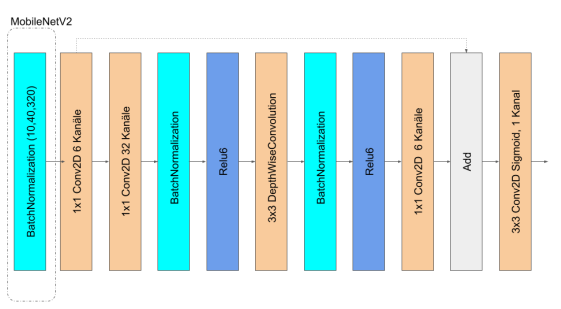

However, experiments had shown that this architecture was not necessary and I could eliminate some parts, ending up with a final architecture as shown below:

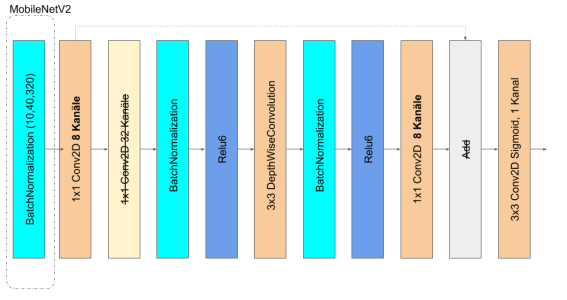

For the second part we had to design a [full decoder block](#highres), to not only detect strawberries but also upscale the image back to its original resolution. For this I used the custom IRes block (as shown above) in alternation with an Convolution Transpose Layer. I chose the Conv2DTranspose Layer instead of separate upsampling and convolution layers to enable the network to learn an upsampling strategy more easily. A schematic view of my architecture is shown below and the implementation is at [the end](#highres) of this notebook.

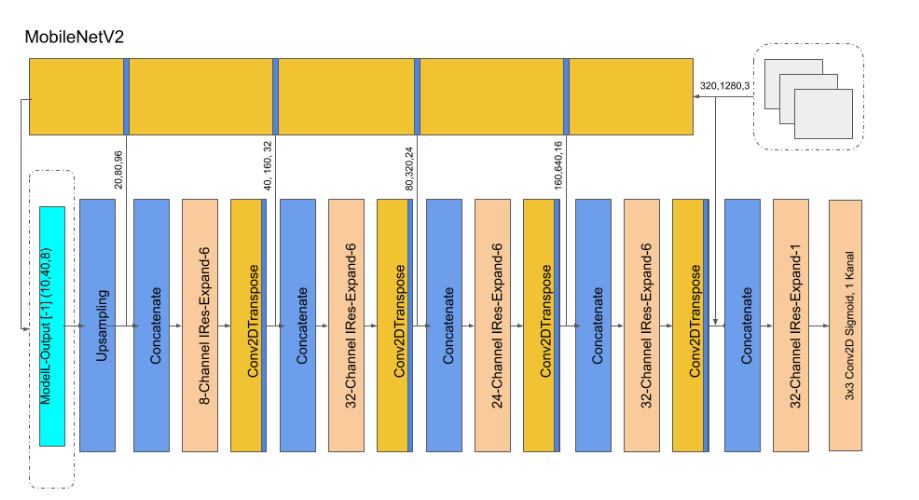

In [1]:
import numpy as np
import math
import keras
from keras import layers
from keras.preprocessing.image import load_img, img_to_array
import tensorflow as tf
#from google.colab import files  # if you use google colab

ModuleNotFoundError: No module named 'keras'

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"

# The Dataset
The dataset is stored in a .zip file with .jpg files for each image and a .json file containing the annotation. Each entry in the annotation is a pair, the first is the image file name, the second is a list of marked points, where each point is a dict with "class", "x", "y" entries. At the moment only the class "Reif" is in the dataset.

In [3]:
# Download the erdbeeren19.zip dataset and unzip it
# Alternative: Set data_root if the dataset is already downloaded.
import os
import glob
data_root = keras.utils.get_file('erdbeeren19.zip','http://www.informatik.uni-bremen.de/agebv2/pub/erdbeeren19.zip', extract=True)
data_root = os.path.join(os.path.split(data_root)[0],"erdbeeren19")
#data_root = "/root/.keras/datasets/erdbeeren19" # Use this instead if the dataset is on your system
print(f"Loaded {len(glob.glob(os.path.join(data_root,'*.*')))} files into {data_root}")

Loaded 1989 files into /home/covis/.keras/datasets/erdbeeren19


In [4]:
# Load the annotation file
import json
import random
with open(os.path.join(data_root, "erdbeeren19.json") , 'r') as f:
   labels = json.load(f)
labels = list(labels.items())
random.shuffle(labels)
nTrain = int(0.8*len(labels))
train = labels[0:nTrain]
test = labels[nTrain:]
print(f"Loaded labels for {len(labels)} images, {len(train)} training, {len(test)} test")
print(f"The training set has {sum([len(e[1]) for e in train])} annotated strawberries.")

Loaded labels for 1988 images, 1590 training, 398 test
The training set has 31126 annotated strawberries.


In [5]:
def loadImage(fname, color_mode='rgb'):
  "Loads an image as a h*w*3 numpy float array converted to [0..1] as range"
  return img_to_array(load_img(os.path.join(data_root,fname),color_mode=color_mode), dtype="float")/255.0

# Load the first image and get the shape of that: All images have the same size
def shapeOfFilename(fname,color_mode='rgb'):
  "Returns the imageshape of fname (filename)."
  imageShape = loadImage(fname, color_mode=color_mode)
  return imageShape.shape

def downsample (T, factor=32):
  """T must be a tensor with at least 3 dimension, where the last three are interpreted as height, width, channels.
     Downsamples the height and width dimension of T by the given factor. 
     The length in these dimensions must be a multiple of factor."""
  sh = T.shape
  assert sh[-3]%factor==0
  assert sh[-2]%factor==0
  newSh = sh[:-3] + (sh[-3]//factor, factor) + (sh[-2]//factor, factor) + sh[-1:]
  return T.reshape(newSh).mean(axis=(-4, -2))

def entropy(x):
    '''Returns the average entropy of the probability distributions in x. The last axis of x
    is assumed to represent the different events with their probabilities. Over this axis the
    entropy is computed, all other axes create just a multitude of such distributions and over
    these axes the average is taken. If the last axis has dimension 1 this is assumed to be
    a binary crossentropy.'''
    tmp = x
    if tmp.shape[-1]==1: # If only one channel we view it as distribution on a binary values
        tmp = np.concatenate((tmp, 1-tmp),axis=-1)
    xlogx = -tmp*np.log(np.maximum(tmp, np.finfo(tmp.dtype).eps))
    return np.average(np.sum(xlogx,axis=-1))

imageShape = shapeOfFilename(labels[0][0])
print(f"Image format {imageShape}.")

Image format (320, 1280, 3).


In [7]:
# Function to show images with annotation (either ground-truth or computed by the algorithm)
# The annotation must be given in the same format as one entry of the dataset.
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = 27, 27

def showImageWithAnnotation(entry):
  "Shows image with filename entry[0] and annotated crosses entry[1] (list of dict with 'x', 'y')"
  image = loadImage(entry[0])
  plt.imshow(image, aspect='equal', interpolation=None)
  x = [label["x"] for label in entry[1]]
  y = [label["y"] for label in entry[1]]
  plt.scatter (x, y, marker="x", c="b")
  plt.show()

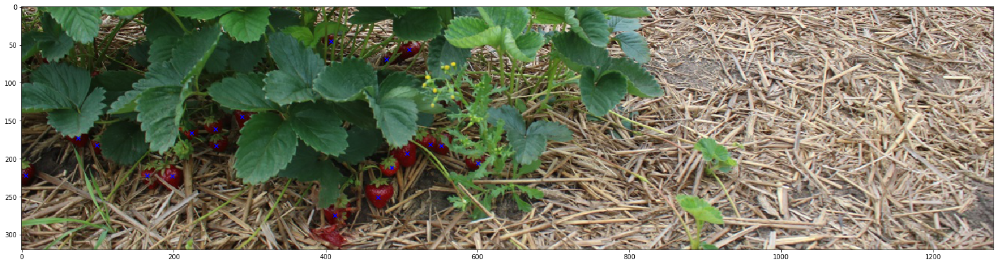

In [8]:
# Test for a random image from the dataset
showImageWithAnnotation(random.choice(labels))

In [9]:
def addToHeatmap (hm, block, x, y):
    """Adds block to hm[y:y+block.shape[0],x:x+block.shape[1]] and 
     works even if part of block extends outside hm. hm and block
     have both 3 dimensions (w*h*c)."""
    # We have a rectangle hm[hylo:hyhi,hxlo:hxhi] 
    # and a rectangle block[bylo:byhi,bxlo:bxhi] which should be added to the
    # hm-rectangle. Some of the h-indices may be out of bounds in which case
    # both the h-index and the corresponding b-index must be adapted.
    bsy, bsx,_ = block.shape
    hsy, hsx,_ = hm.shape
    # Initially start with considering the full b-block
    hxlo = x
    hylo = y
    hxhi = x+bsx
    hyhi = y+bsy
    bxlo = 0
    bylo = 0
    bxhi = bsx
    byhi = bsy
    if 0<=hxlo and hxhi<=hsx and 0<=hylo and hyhi<=hsy: # fully inside hm
        hm[hylo:hyhi,hxlo:hxhi]
        hm[hylo:hyhi,hxlo:hxhi] += block
        #print(block)
        #print(hm[hylo:hyhi,hxlo:hxhi])
    else: 
        if hxlo<0: hxlo, bxlo = 0, bxlo-hxlo # clip left side
        if hxhi>hsx: hxhi, bxhi = hsx, bxhi+hsx-hxhi # clip right side
        if hylo<0: hylo, bylo = 0, bylo-hylo # clip top side
        if hyhi>hsy: hyhi, byhi = hsy, byhi+hsy-hyhi # clip bottom side
        if bxlo>=bxhi or bylo>=byhi: return # fully outside hm
        #print(f"hm[{hylo}:{hyhi},{hxlo}:{hxhi}] += block[{bylo}:{byhi},{bxlo}:{bxhi}]")
        hm[hylo:hyhi,hxlo:hxhi] += block[bylo:byhi,bxlo:bxhi]

 # Data preparation <a id='dataprep'></a>

In [10]:
# TODO: Implement
def gaussian (sigma, dim):
    """Returns a dim*dim*1 array with a not normalized 
     Gaussian centered at dim//2, dim//2
     with peak value 1 and the given sigma."""
    x = np.arange(dim)
    y = x[:,np.newaxis]
    mu = dim//2
    my_gauss = np.exp(-((x-mu)**2 + (y-mu)**2) / (2*sigma**2))
    my_gauss = my_gauss.reshape(dim,dim,1)
    return my_gauss

myGaussian = gaussian (8, 33) # Choose sensible numbers

# HINT: Heatmaps need to have 3 dimensions (y / x / channel) even if they have
# only one channel
def annotationToHeatmap (annotation):
    """Converts a list of points (each a dict with 'x' and 'y' component) into 
    a heatmap with original image resolution using myGaussian. For every 
    strawberry, the Gaussian myGaussian (peak 1) centered at the 
    annotated strawberry point is added. The whole result must be clipped
    to a range of [0..1]."""
    hm = np.zeros((imageShape[0],imageShape[1],1))
    [addToHeatmap(hm, myGaussian, (label['x']-myGaussian.shape[0]//2), (label['y']-myGaussian.shape[1]//2)) for label in annotation]
    hm = np.clip(hm,a_min=0,a_max=1)
    return hm

In [11]:
def showImageWithHeatmap (image, hm=None, gt=None, filename=None, exaggerate=1):
    """Shows image (range [0..1]), the annotation by a heatmap hm [0..1] and the groundTruth gt. 
     The hm.shape must be an integer fraction of the image shape. gt must 
     have be a list of dicts with 'x' and 'y' entries as in the dataset. 
     Both hm and gt can be None in which case they are skipped. 
     If filename is given, the plot is saved."""
    if hm is not None:
        factor = image.shape[0]//hm.shape[0]
        assert hm.shape[0]*factor==image.shape[0] and hm.shape[1]*factor==image.shape[1]
        assert len(hm.shape)==3
        hmResized = np.repeat (hm, factor, axis=0) # y
        hmResized = np.repeat (hmResized, factor, axis=1) #x
        hmResized = np.repeat (hmResized, 3, axis=2) # factor for RGB
        hmResized = np.clip (hmResized*2, 0, 1)
        if image.dtype =="uint8": image = impage/255.0
        image = np.clip(image*150 + (128*exaggerate)*hmResized,0,255).astype(np.uint8)
    plt.imshow(image, aspect='equal', interpolation=None)
    if gt is not None:
        x = [label["x"] for label in gt]
        y = [label["y"] for label in gt]
        plt.scatter (x, y, marker="x", c="b")
    if filename is not None:
        plt.savefig(filename, dpi=150, bbox_inches='tight')
    plt.show()

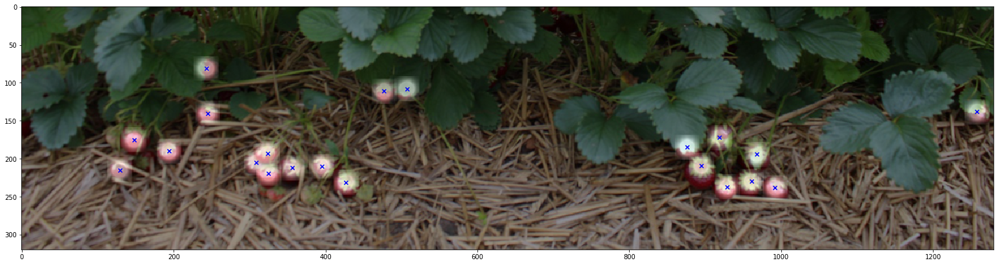

In [12]:
# Show a random entry of the dataset with the annotation converted to a heatmap
# Use this function to check that annotationToHeatmap works
n = random.randint(0,len(labels))
showImageWithHeatmap (loadImage(labels[1][0]), annotationToHeatmap(labels[1][1]), labels[1][1], "annotation.png")

In [13]:
# Tools to load the training / test set on the fly, so the whole dataset
# doesn't need to be kept in memory.
def dummyPrepareEntry (entry):
  """Dummy function to prepare and entry of the dataset. It takes one entry
     and converts it to a input, ground-truth output pair that is given
     to keras. At the moment the image is loaded and the output is just empty."""
  return (loadImage(entry[0]), [])

class DataGenerator(tf.keras.utils.Sequence):
     """Provides a dataset of the erdbeer to keras in a load on demand fashion
     The dataset must have the format dict filename-->list[dict{"x", "y"}].
     To obtain the actual entry, the filename is loaded and converted to
     an image and the labels passed to a given function to convert it into
     a tensor.
     Adapted from https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly"""
    
     def __init__(self, dataset, prepareEntry=dummyPrepareEntry, batch_size=4, shuffle=True):
        'Initialization'
        self.dataset = dataset
        self.prepareEntry = prepareEntry
        self.batch_size = batch_size
        self.shuffle = shuffle
        
     def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.dataset) / self.batch_size))
      
     def __getitem__(self, index):
          'Generate one batch of data'
          batch = self.dataset[index*self.batch_size:(index+1)*self.batch_size]
          batch = [self.prepareEntry(e) for e in batch]
          X = np.array([e[0] for e in batch])
          y = np.array([e[1] for e in batch])
          return X, y
        
     def get_ground_truth (self, index):
          'Generate ground_truth for the batch in the original format (not heatmap).'
          batch = self.dataset[index*self.batch_size:(index+1)*self.batch_size]
          return [e[1] for e in batch]          

     def on_epoch_end(self):
         'Updates indexes after each epoch'
         random.shuffle(self.dataset)

In [14]:
def prepareEntryLowResHeatmap (entry):
    """Get's an entry of the dataset (filename, annotation), loads filename and
    converts annotation into a low-res heatmap. Returning both as x, y pair.
    to be passed to keras."""
    filename, annotation = entry
    X = loadImage(filename) * 2 -1
    y = downsample(annotationToHeatmap(annotation))
    return X, y

def prepareEntryHighResHeatmap (entry):
    """Get's an entry of the dataset (filename, annotation), load filename and
    converts annotation into a low-res heatmap. Returning both as x, y pair.
    to be passed to keras."""
    filename, annotation = entry
    return loadImage(filename)*2-1, annotationToHeatmap(annotation)

Lowres
X has shape(4, 320, 1280, 3), type float64, range [-1.000..1.000]
y has shape(4, 10, 40, 1), type float64, range [0.000..0.696] and entropy [0.053..0.110]


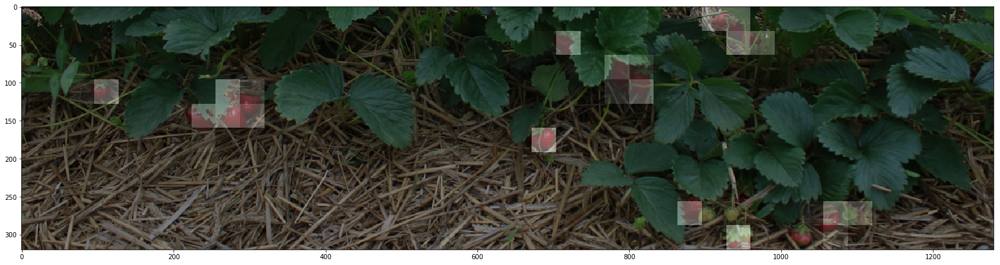

Hires
X has shape(4, 320, 1280, 3), type float64, range [-1.000..1.000]
y has shape(4, 320, 1280, 1), type float64, range [0.000..1.000] and entropy [0.030..0.110]


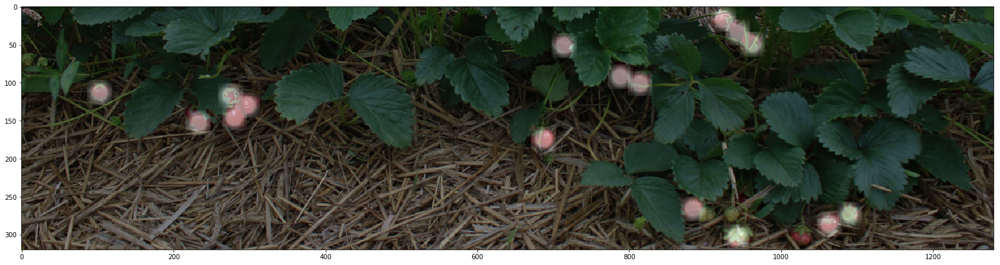

In [15]:
# Use this to test that the data generator works and in particular that the format,
# datatypes and value ranges are correct
# Remember: Mobilenet needs pixels in the [-1..+1] range
def showFirstEntryOfGenerator (dataGen):
  """Fetches the first batch, prints dataformat statistics and 
  shows the first entry both as image X and annotation y."""
  X, y = dataGen[0]
  eLo = entropy(y)
  eHi = entropy(np.mean(y, axis=(0,1,2)))
  print(f"X has shape{X.shape}, type {X.dtype}, range [{np.min(X):.3f}..{np.max(X):.3f}]")
  print(f"y has shape{y.shape}, type {y.dtype}, range [{np.min(y):.3f}..{np.max(y):.3f}] and entropy [{eLo:.3f}..{eHi:.3f}]")
  showImageWithHeatmap ((X[0]+1)/2, y[0]) 

print("Lowres")
trainGenL = DataGenerator (train, prepareEntry=prepareEntryLowResHeatmap)
testGenL = DataGenerator (test, prepareEntry=prepareEntryLowResHeatmap)
showFirstEntryOfGenerator (trainGenL)

print("Hires")
trainGenH = DataGenerator (train, prepareEntry=prepareEntryHighResHeatmap)
testGenH = DataGenerator (test, prepareEntry=prepareEntryHighResHeatmap)
showFirstEntryOfGenerator (trainGenH)

In [16]:
# Now construct the low-res net and store it into the variable modelL
# Loading of MobileNet.V2 will give a warning "`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default."
# That's correct.
# Proceed as described in abv-uebung-6.pdf and discuss the architecture.
# Inspect the architecture with model.summary() to make sure, that the number of trainable weights
# is compatible to the amount of data we have.
#
# For reference you can access the MobileNet.V2 source code at
# https://github.com/keras-team/keras-applications/blob/master/keras_applications/mobilenet_v2.py

# TODO implement
# modelL.summary()

 # Implementation low resolution head <a id='lowres'></a>

In [17]:
mobile_net_backbone = tf.keras.applications.MobileNetV2(
        input_shape=imageShape,
        alpha=1.0,
        include_top=False,
        weights="imagenet",
        input_tensor=None,
        pooling=None,
    )
# Freeze pre-trained model
mobile_net_backbone.trainable = False
mobile_net_backbone.summary()

/home/covis/.pyenv/versions/3.7.1/envs/py-3.7.1-gpu/lib/python3.7/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 320, 1280, 3 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 321, 1281, 3) 0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 160, 640, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 160, 640, 32) 128         Conv1[0][0]                      
_______________________________________________________________________________

In [18]:
backbone_output = mobile_net_backbone.layers[-4].output

In [19]:
ires_block = tf.keras.layers.Conv2D(kernel_size=1, filters=8,padding="same")(backbone_output)
ires_block = tf.keras.layers.BatchNormalization()(ires_block)
ires_block = tf.keras.layers.ReLU(max_value=6)(ires_block)

ires_block = tf.keras.layers.DepthwiseConv2D(kernel_size=3, padding="same")(ires_block)
ires_block = tf.keras.layers.BatchNormalization()(ires_block)
ires_block = tf.keras.layers.ReLU(max_value=6)(ires_block)

ires_output = tf.keras.layers.Conv2D(kernel_size=1, filters=8,padding="same")(ires_block)

fine_tune_layers = tf.keras.layers.Conv2D(filters=1,kernel_size=3,activation='sigmoid', padding="same")(ires_output)
modelL = tf.keras.Model(inputs=mobile_net_backbone.input, outputs=fine_tune_layers)

In [20]:
modelL.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 320, 1280, 3 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 321, 1281, 3) 0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 160, 640, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 160, 640, 32) 128         Conv1[0][0]                      
______________________________________________________________________________________________

In [21]:
modelL.compile(optimizer='adam', loss='binary_crossentropy')

In [22]:
base_path = f"low_res_final/" 
filepath= base_path + "epochs:{epoch:03d}-val_loss:{val_loss:.5f}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath, 
                                                monitor='val_loss',
                                                save_best_only=True, 
                                                save_weights_only=True)

In [25]:
history = modelL.fit(trainGenL, epochs=15, validation_data=testGenL, callbacks=[checkpoint])

W0626 16:27:57.835269 140535686672512 data_adapter.py:1091] sample_weight modes were coerced from
  ...
    to  
  ['...']
W0626 16:27:57.960845 140535686672512 data_adapter.py:1091] sample_weight modes were coerced from
  ...
    to  
  ['...']


Train for 397 steps, validate for 99 steps
Epoch 1/15
397/397 [==============================] - 69s 174ms/step - loss: 0.1117 - val_loss: 0.0754
Epoch 2/15
397/397 [==============================] - 66s 166ms/step - loss: 0.0701 - val_loss: 0.0717
Epoch 3/15
397/397 [==============================] - 70s 178ms/step - loss: 0.0675 - val_loss: 0.0699
Epoch 4/15
397/397 [==============================] - 68s 170ms/step - loss: 0.0660 - val_loss: 0.0695
Epoch 5/15
397/397 [==============================] - 67s 168ms/step - loss: 0.0650 - val_loss: 0.0695
Epoch 6/15
397/397 [==============================] - 69s 175ms/step - loss: 0.0644 - val_loss: 0.0677
Epoch 7/15
397/397 [==============================] - 67s 168ms/step - loss: 0.0641 - val_loss: 0.0677
Epoch 8/15
397/397 [==============================] - 67s 168ms/step - loss: 0.0639 - val_loss: 0.0680
Epoch 9/15
397/397 [==============================] - 67s 169ms/step - loss: 0.0637 - val_loss: 0.0683
Epoch 10/15
397/397 [=========

In [26]:
modelL.save_weights(base_path + 'final_weights.hdf5')

In [42]:
modelL.load_weights(base_path + 'epochs:011-val_loss:0.06731.hdf5')

In [38]:
plt.rcParams['figure.figsize'] = 27, 27


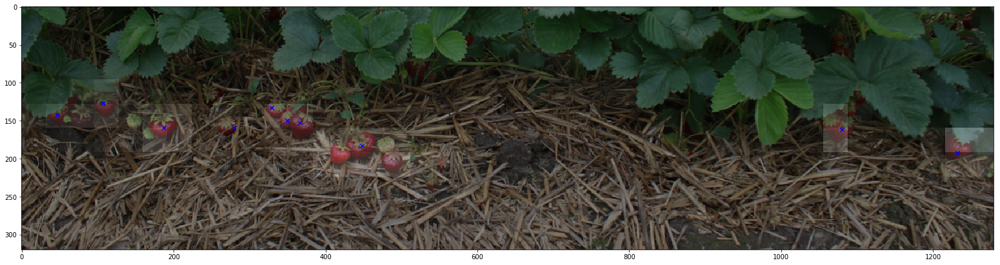

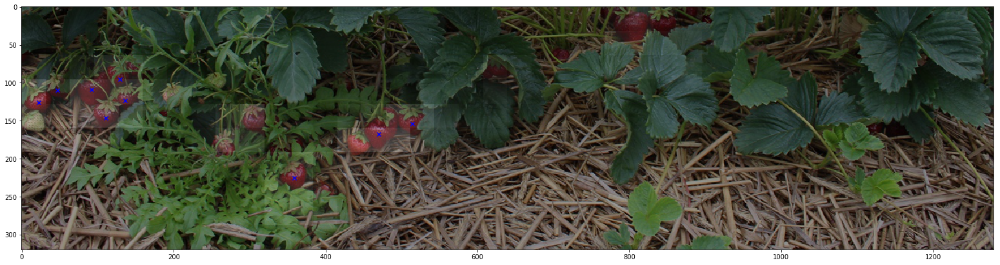

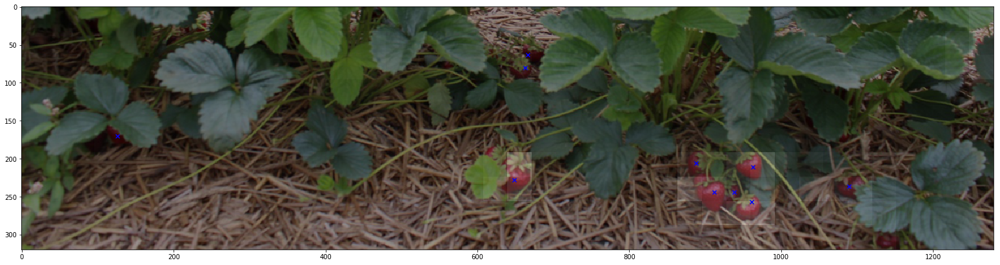

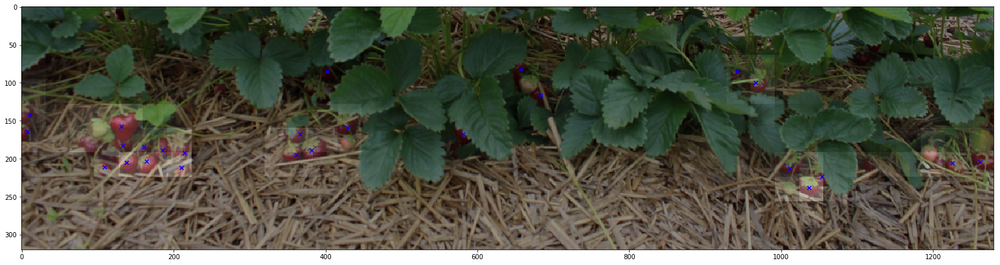

In [43]:
# Use this to visualize results
# It shows the input image (background), the predicted heatmap (white "fog" in foreground)
# and the ground-truth (blue crosses)
testIdx = random.randint(0,len(testGenL))
testBatch = testGenL[testIdx]
gtBatch = testGenL.get_ground_truth (testIdx)
yHats = modelL.predict (testBatch[0])
for i in range(0,len(yHats)):
    showImageWithHeatmap ((testBatch[0][i]+1)/2, yHats[i], gtBatch[i], filename=f"result-L-{i}.png") 

In [44]:
preds = []
gts = []
for testIdx in range(99):
    testBatch = testGenL[testIdx]
    gtBatch = [downsample(annotationToHeatmap(gt)) for gt in testGenL.get_ground_truth(testIdx)]
    preds.extend(modelL.predict(testBatch[0]))
    gts.extend(gtBatch)
m = tf.keras.metrics.MeanAbsoluteError()
_ = m.update_state(gts, preds)
print(f"MAE: {m.result().numpy()}")

MAE: 0.020080674439668655


# High Resolution Implementation <a id='highres'></a>

In [22]:
# Now construct the high-res net and store it into the variable modelH
# Loading of MobileNet.V2 will give a warning "`input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default."
# That's correct.
# Proceed as described in abv-uebung-6.pdf and discuss the architecture.
# Inspect the architecture with model.summary() to make sure, that the number of trainable weights
# is compatible to the amount of data we have.
#
# For reference you can access the MobileNet.V2 source code at
# https://github.com/keras-team/keras-applications/blob/master/keras_applications/mobilenet_v2.py

# TODO implement
# modelH.summary()

In [45]:
modelL.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 320, 1280, 3 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 321, 1281, 3) 0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 160, 640, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 160, 640, 32) 128         Conv1[0][0]                      
______________________________________________________________________________________________

### Upsampling mit UpSample2d. Input letztes Layer vor Ausgabe des LowResModells
#### Input dim `10, 40` Output dim `20,80` 
#### Gesamtparamter vorher: `28.737` Gesamtparameter nachher`28.448`

In [81]:
decoder = modelL.layers[-2].output
ires_input = tf.keras.layers.UpSampling2D(size=2, name="start_decoder")(decoder)

In [82]:
shortcut_20_80 = modelL.get_layer('block_12_add').output

In [83]:
# Concat with shortcut on channel dimension
decoder = tf.keras.layers.concatenate(inputs=[shortcut_20_80, ires_input])

decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=8*6,padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.DepthwiseConv2D(kernel_size=3, padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=8,padding="same")(decoder)

decoder = tf.keras.layers.add([decoder, ires_input])

### Out-Params: `8,856`, 
`31.000` Erdbeeren => `1x1= 1` Pixel pro Erdbeere `x 31.000/10` (wg. 1-in-10Rule) `* 4` (wg. 1 Pixel wird zu 4 Pixel) 
### `= 12.400` Parameter für die vorrangegangene Schicht möglich

In [84]:
# Upsampling with Conv2dTranspose
ires_input = tf.keras.layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding="same")(decoder)

In [85]:
shortcut_40_160 = modelL.get_layer('block_5_add').output

In [86]:
# Concat with shortcut on channel dimension
decoder = tf.keras.layers.concatenate(inputs=[shortcut_40_160, ires_input])

decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=32*6,padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.DepthwiseConv2D(kernel_size=3, padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=32,padding="same")(decoder)

decoder = tf.keras.layers.add([decoder, ires_input])

### Out-Params: `32,536`, 
`31.000` Erdbeeren => `4x4 = 16` Pixel pro Erdbeere `x 31.000/10 = 3.100` (wg. 1-in-10Rule) `* 4` (wg. 1 Pixel wird zu 4 Pixel) 
### `= 198.400` Parameter für die vorrangegangene Schicht möglich

In [87]:
# Upsampling with Conv2dTranspose
ires_input = tf.keras.layers.Conv2DTranspose(filters=24, kernel_size=3, strides=2, padding="same")(decoder)

In [88]:
shortcut_80_320 = modelL.get_layer('block_2_add').output
decoder = tf.keras.layers.concatenate(inputs=[shortcut_80_320, ires_input])

In [89]:
decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=24*6,padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.DepthwiseConv2D(kernel_size=3, padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=24,padding="same")(decoder)

decoder = tf.keras.layers.add([decoder, ires_input])

### Out-Params: `52,024`, 
`31.000` Erdbeeren => `8x8 = 64` Pixel pro Erdbeere `x 31.000/10 = 3.100` (wg. 1-in-10Rule) `* 4` (wg. 1 Pixel wird zu 4 Pixel) 
### `= 793.600` Parameter für die vorrangegangene Schicht möglich

In [91]:
# Upsampling with Conv2dTranspose
ires_input = tf.keras.layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding="same")(decoder)

In [92]:
shortcut_160_640 = modelL.get_layer('expanded_conv_project_BN').output
decoder = tf.keras.layers.concatenate(inputs=[shortcut_160_640, ires_input])

In [93]:
decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=32*6,padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.DepthwiseConv2D(kernel_size=3, padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=32,padding="same")(decoder)

decoder = tf.keras.layers.add([decoder, ires_input])

### Out-Params: `77,240`, 
`31.000` Erdbeeren => `16x16 = 256` Pixel pro Erdbeere `x 31.000/10 = 3.100` (wg. 1-in-10Rule) `* 4` (wg. 1 Pixel wird zu 4 Pixel) 
### `= 3.174.400` Parameter für die vorrangegangene Schicht möglich

In [95]:
# Upsampling with Conv2dTranspose
ires_input = tf.keras.layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding="same")(decoder)

In [96]:
shortcut_320_1280 = modelL.get_layer('input_1').output
decoder = tf.keras.layers.concatenate(inputs=[shortcut_320_1280, ires_input])

In [97]:
decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=32,padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.DepthwiseConv2D(kernel_size=3, padding="same")(decoder)
decoder = tf.keras.layers.BatchNormalization()(decoder)
decoder = tf.keras.layers.ReLU(max_value=6)(decoder)

decoder = tf.keras.layers.Conv2D(kernel_size=1, filters=32,padding="same")(decoder)

#decoder = tf.keras.layers.add([decoder, ires_input])

### Out-Params: `89,144`, 
`31.000` Erdbeeren => `32x32 = 1024` Pixel pro Erdbeere `x 31.000/10 = 3.100` (wg. 1-in-10Rule) `* 4` (wg. 1 Pixel wird zu 4 Pixel) 
### `= 12.697.600` Parameter für die vorrangegangene Schicht möglich

In [99]:
decoder =tf.keras.layers.Conv2D(filters=1, kernel_size=3, padding="same", activation="sigmoid")(decoder)

In [100]:
modelH = tf.keras.Model(inputs=mobile_net_backbone.input, outputs=decoder)
modelH.summary()

Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 320, 1280, 3 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 321, 1281, 3) 0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 160, 640, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 160, 640, 32) 128         Conv1[0][0]                      
___________________________________________________________________________________________

In [101]:
modelH.compile(optimizer='adam', loss='binary_crossentropy')

In [103]:
base_path = f"high_res_final/" 
filepath= base_path + "epochs:{epoch:03d}-val_loss:{val_loss:.5f}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath, 
                                                monitor='val_loss',
                                                save_best_only=True, 
                                                save_weights_only=True)

In [104]:
history = modelH.fit(trainGenH, epochs=15, validation_data=testGenH, callbacks=[checkpoint])

W0629 16:18:01.201891 140127828979840 data_adapter.py:1091] sample_weight modes were coerced from
  ...
    to  
  ['...']
W0629 16:18:01.367727 140127828979840 data_adapter.py:1091] sample_weight modes were coerced from
  ...
    to  
  ['...']


Train for 397 steps, validate for 99 steps
Epoch 1/15
397/397 [==============================] - 160s 403ms/step - loss: 0.0510 - val_loss: 0.0505
Epoch 2/15
397/397 [==============================] - 151s 380ms/step - loss: 0.0393 - val_loss: 0.0392
Epoch 3/15
397/397 [==============================] - 152s 383ms/step - loss: 0.0385 - val_loss: 0.0394
Epoch 4/15
397/397 [==============================] - 153s 386ms/step - loss: 0.0379 - val_loss: 0.0390
Epoch 5/15
397/397 [==============================] - 152s 383ms/step - loss: 0.0374 - val_loss: 0.0389
Epoch 6/15
397/397 [==============================] - 152s 383ms/step - loss: 0.0372 - val_loss: 0.0409
Epoch 7/15
397/397 [==============================] - 152s 382ms/step - loss: 0.0368 - val_loss: 0.0398
Epoch 8/15
397/397 [==============================] - 150s 378ms/step - loss: 0.0365 - val_loss: 0.0423
Epoch 9/15
397/397 [==============================] - 152s 383ms/step - loss: 0.0363 - val_loss: 0.0401
Epoch 10/15
397/397 [

In [105]:
modelH.save_weights(base_path + "final_weights.hdf5")

In [121]:
modelH.load_weights(base_path +  'epochs:005-val_loss:0.03895.hdf5')

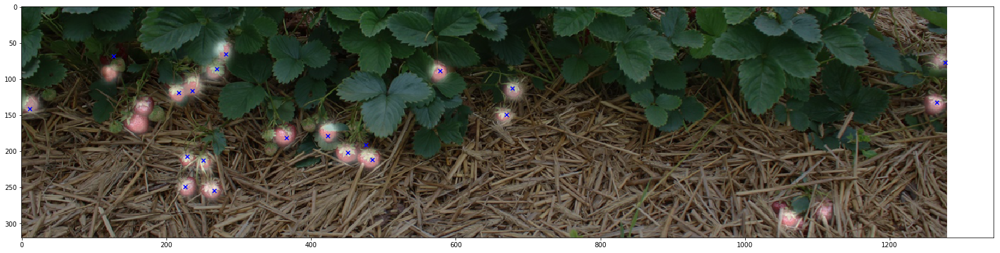

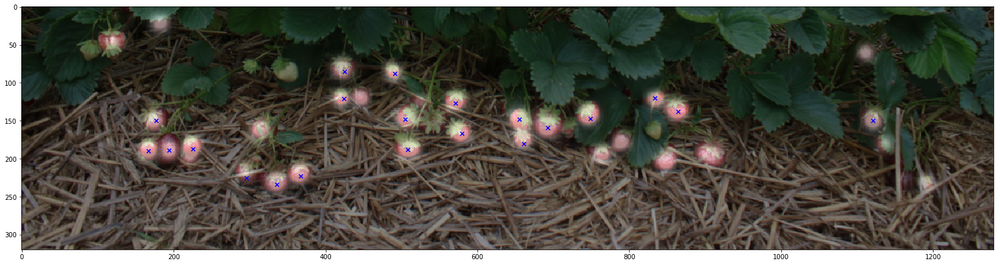

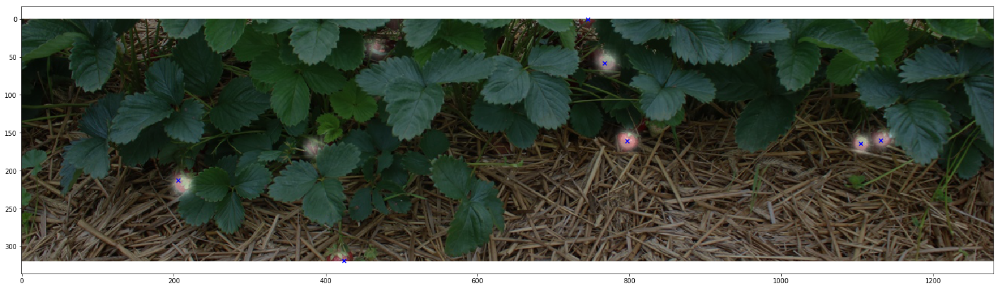

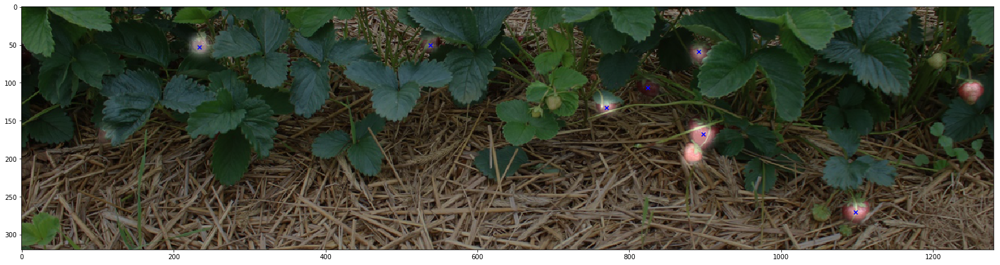

In [122]:
# Use this to visualize results
# It shows the input image (background), the predicted heatmap (white "fog" in foreground)
# and the ground-truth (blue crosses)
testIdx = random.randint(0,len(testGenH))
testBatch = testGenH[testIdx]
gtBatch = testGenH.get_ground_truth (testIdx)
yHats = modelH.predict (testBatch[0])
for i in range(0,len(yHats)):
   showImageWithHeatmap ((testBatch[0][i]+1)/2, yHats[i], gtBatch[i], filename=f"result-H-{i}.png") 

In [123]:
preds = []
gts = []
for testIdx in range(len(testGenH)):
    testBatch = testGenH[testIdx]
    gtBatch = [annotationToHeatmap(gt) for gt in testGenH.get_ground_truth(testIdx)]
    preds.extend(modelH.predict(testBatch[0]))
    gts.extend(gtBatch)
    

In [124]:
m = tf.keras.metrics.MeanAbsoluteError()
_ = m.update_state(gts, preds)
print(f"MAE: {m.result().numpy()}")

MAE: 0.012491330498456955
